In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import torch
from torch import nn, tensor
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
from torchvision.transforms import transforms, ToTensor
import torchvision.utils as vutils


LATENT = 32
DIMS_E = [16, 32, 64, 32]
DIMS_G = [32, 64, 32, 16]
DIMS_D = [16, 32, 64, 32]
MODEL_E_PATH = "anime-64x64-e.pth"
MODEL_G_PATH = "anime-64x64-g.pth"
MODEL_D_PATH = "anime-64x64-d.pth"
EXPORT_PATH = "raw-weights-anime-64x64"


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


In [6]:

class AnimeFaceDataset(Dataset):

    def __init__(self, transform=None, target_transform=None):
        self.size = 64
        self.path = "../data/AnimeFace/64x64.raw"
        raw_bytes = np.fromfile(self.path, dtype=np.uint8)
        self.content = raw_bytes.reshape((60000, 3, 64, 64))
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        #return 10000
        return 60000

    def __getitem__(self, i):
        return self.content[i%1000].astype(np.float32) / 255.0


def load_data(dataset, plot=False):
    dataloader = DataLoader(
        dataset,
        batch_size=128,
        shuffle=True
    )
    for x in dataloader:
        print("Shape of x:", x.shape)
        break
    if plot:
        plt.figure(figsize=(8, 8))
        plt.axis("off")
        plt.title("Training Images")
        plt.imshow(np.transpose(vutils.make_grid(
            next(iter(dataloader)).to(device)[:64],
            padding=2, pad_value=0.5, normalize=True).cpu(), (1, 2, 0)),
                   interpolation='nearest')
        plt.show()
    return dataloader


In [7]:
class Encoder(nn.Module):

    def __init__(self):
        super(Encoder, self).__init__()
        # Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=0)
        dims = DIMS_E
        self.main = nn.Sequential(
            # 3 x 64x64
            nn.Conv2d(3, dims[0], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[0]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[0] x 32x32
            nn.Conv2d(dims[0], dims[1], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[1]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[1] x 16x16
            nn.Conv2d(dims[1], dims[2], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[2]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[2] x 8x8
            nn.Conv2d(dims[2], dims[3], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[3]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[3] x 4x4
            nn.Conv2d(dims[3], LATENT, 4, 1, 0, bias=False),
            nn.Flatten()
        )

    def forward(self, x):
        return self.main(x)


class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        # ConvTranspose2d(in_channels, out_channels, kernel_size, stride=1, padding=0)
        # https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md
        dims = DIMS_G
        layers = [
            # LATENT
            nn.Linear(LATENT, dims[0]*4*4, bias=False),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Unflatten(1, (dims[0], 4, 4)),
            # dims[0] x 4x4
            nn.ConvTranspose2d(dims[0], dims[1], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[1]),
            nn.LeakyReLU(0.1, inplace=True),
            # dims[1] x 8x8
            nn.ConvTranspose2d(dims[1], dims[2], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[2]),
            nn.LeakyReLU(0.1, inplace=True),
            # dims[2] x 16x16
            nn.ConvTranspose2d(dims[2], dims[3], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[3]),
            nn.LeakyReLU(0.1, inplace=True),
            # dims[3] x 32x32
            nn.ConvTranspose2d(dims[3], 3, 4, 2, 1, bias=False),
            nn.Sigmoid()
            # 3 x 64x64
        ]
        layers = [layer for layer in layers if layer is not None]
        self.main = nn.Sequential(*layers)

    def forward(self, x):
        return self.main(x)


class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()
        # Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=0)
        dims = DIMS_D
        self.main = nn.Sequential(
            # 3 x 64x64
            nn.Conv2d(3, dims[0], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[0]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[0] x 32x32
            nn.Conv2d(dims[0], dims[1], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[1]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[1] x 16x16
            nn.Conv2d(dims[1], dims[2], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[2]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[2] x 8x8
            nn.Conv2d(dims[2], dims[3], 4, 2, 1, bias=False),
            nn.BatchNorm2d(dims[3]),
            nn.LeakyReLU(0.2, inplace=True),
            # dims[3] x 4x4
            nn.Conv2d(dims[3], 1, 4, 1, 0, bias=False),
            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)


Shape of x: torch.Size([128, 3, 64, 64])
Encoder 91168
Encoder(
  (main): Sequential(
    (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=Tru

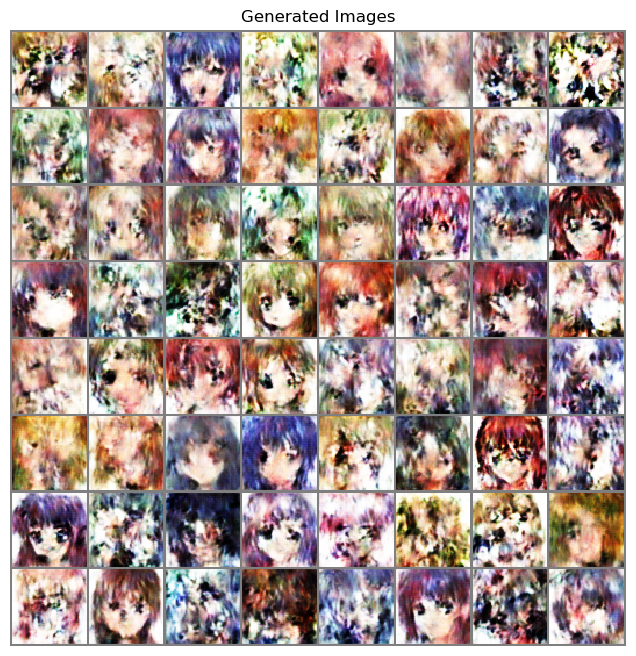

Epoch 6
[100/469]  loss_diff=0.2601 loss_vae=0.0271 loss_d=0.0025 loss_d_eg=0.0201 loss=0.3074
[200/469]  loss_diff=0.2551 loss_vae=0.0294 loss_d=0.0029 loss_d_eg=0.0216 loss=0.3062
[300/469]  loss_diff=0.2487 loss_vae=0.0265 loss_d=0.0029 loss_d_eg=0.0179 loss=0.2931
[400/469]  loss_diff=0.2573 loss_vae=0.0234 loss_d=0.0040 loss_d_eg=0.0098 loss=0.2905
Epoch 7
[100/469]  loss_diff=0.2595 loss_vae=0.0266 loss_d=0.0026 loss_d_eg=0.0156 loss=0.3017
[200/469]  loss_diff=0.2507 loss_vae=0.0274 loss_d=0.0034 loss_d_eg=0.0271 loss=0.3052
[300/469]  loss_diff=0.2566 loss_vae=0.0281 loss_d=0.0021 loss_d_eg=0.0140 loss=0.2987
[400/469]  loss_diff=0.2503 loss_vae=0.0250 loss_d=0.0023 loss_d_eg=0.0191 loss=0.2945
Epoch 8
[100/469]  loss_diff=0.2487 loss_vae=0.0227 loss_d=0.0057 loss_d_eg=0.0176 loss=0.2891
[200/469]  loss_diff=0.2518 loss_vae=0.0321 loss_d=0.0035 loss_d_eg=0.0081 loss=0.2920
[300/469]  loss_diff=0.2499 loss_vae=0.0237 loss_d=0.0037 loss_d_eg=0.0083 loss=0.2819
[400/469]  loss_dif

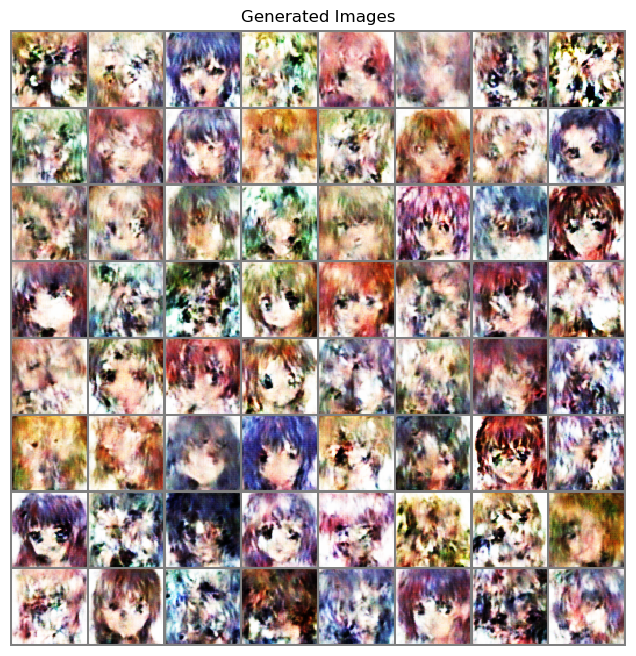

Epoch 11
[100/469]  loss_diff=0.2603 loss_vae=0.0245 loss_d=0.0033 loss_d_eg=0.0176 loss=0.3024
[200/469]  loss_diff=0.2455 loss_vae=0.0284 loss_d=0.0035 loss_d_eg=0.0107 loss=0.2846
[300/469]  loss_diff=0.2569 loss_vae=0.0299 loss_d=0.0047 loss_d_eg=0.0266 loss=0.3134
[400/469]  loss_diff=0.2509 loss_vae=0.0270 loss_d=0.0029 loss_d_eg=0.0136 loss=0.2915
Epoch 12
[100/469]  loss_diff=0.2570 loss_vae=0.0247 loss_d=0.0039 loss_d_eg=0.0150 loss=0.2967
[200/469]  loss_diff=0.2542 loss_vae=0.0271 loss_d=0.0034 loss_d_eg=0.0095 loss=0.2907
[300/469]  loss_diff=0.2545 loss_vae=0.0360 loss_d=0.0025 loss_d_eg=0.0130 loss=0.3035
[400/469]  loss_diff=0.2496 loss_vae=0.0257 loss_d=0.0039 loss_d_eg=0.0078 loss=0.2830
Epoch 13
[100/469]  loss_diff=0.2562 loss_vae=0.0255 loss_d=0.0029 loss_d_eg=0.0168 loss=0.2984
[200/469]  loss_diff=0.2570 loss_vae=0.0275 loss_d=0.0033 loss_d_eg=0.0184 loss=0.3029
[300/469]  loss_diff=0.2507 loss_vae=0.0276 loss_d=0.0033 loss_d_eg=0.0112 loss=0.2895
[400/469]  loss_

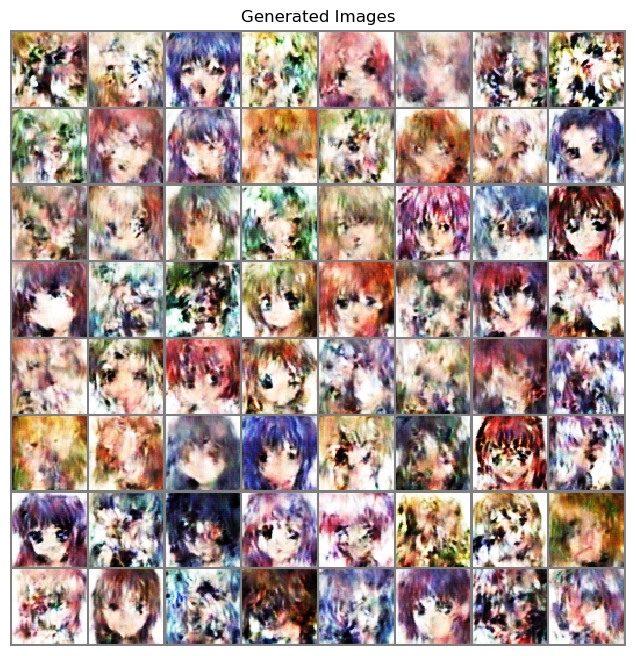

Epoch 16
[100/469]  loss_diff=0.2544 loss_vae=0.0276 loss_d=0.0030 loss_d_eg=0.0166 loss=0.2986
[200/469]  loss_diff=0.2516 loss_vae=0.0287 loss_d=0.0023 loss_d_eg=0.0160 loss=0.2962
[300/469]  loss_diff=0.2563 loss_vae=0.0281 loss_d=0.0033 loss_d_eg=0.0132 loss=0.2975
[400/469]  loss_diff=0.2627 loss_vae=0.0246 loss_d=0.0025 loss_d_eg=0.0224 loss=0.3098
Epoch 17
[100/469]  loss_diff=0.2550 loss_vae=0.0286 loss_d=0.0023 loss_d_eg=0.0163 loss=0.3000
[200/469]  loss_diff=0.2526 loss_vae=0.0283 loss_d=0.0034 loss_d_eg=0.0164 loss=0.2973
[300/469]  loss_diff=0.2535 loss_vae=0.0281 loss_d=0.0029 loss_d_eg=0.0186 loss=0.3002
[400/469]  loss_diff=0.2558 loss_vae=0.0295 loss_d=0.0028 loss_d_eg=0.0196 loss=0.3049
Epoch 18
[100/469]  loss_diff=0.2503 loss_vae=0.0316 loss_d=0.0030 loss_d_eg=0.0185 loss=0.3003
[200/469]  loss_diff=0.2618 loss_vae=0.0261 loss_d=0.0027 loss_d_eg=0.0143 loss=0.3022
[300/469]  loss_diff=0.2519 loss_vae=0.0290 loss_d=0.0037 loss_d_eg=0.0092 loss=0.2901
[400/469]  loss_

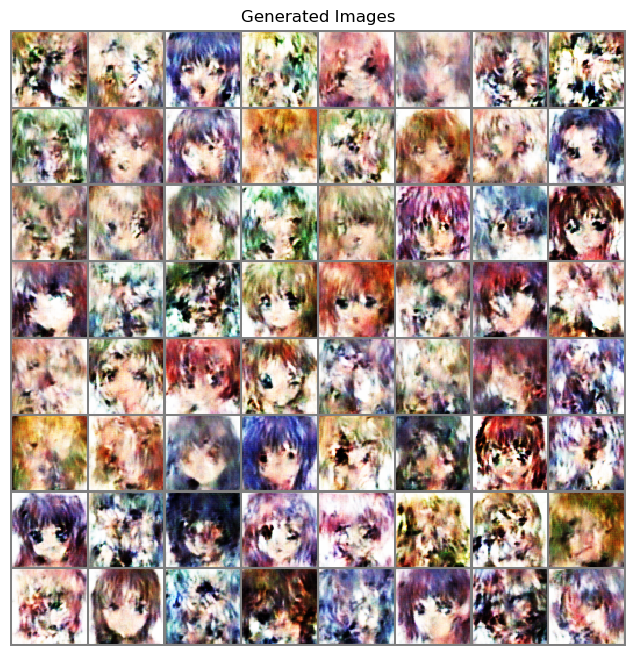

Epoch 21
[100/469]  loss_diff=0.2490 loss_vae=0.0266 loss_d=0.0031 loss_d_eg=0.0132 loss=0.2887
[200/469]  loss_diff=0.2618 loss_vae=0.0268 loss_d=0.0029 loss_d_eg=0.0174 loss=0.3060
[300/469]  loss_diff=0.2587 loss_vae=0.0272 loss_d=0.0042 loss_d_eg=0.0070 loss=0.2928
[400/469]  loss_diff=0.2457 loss_vae=0.0281 loss_d=0.0035 loss_d_eg=0.0130 loss=0.2869
Epoch 22
[100/469]  loss_diff=0.2527 loss_vae=0.0311 loss_d=0.0016 loss_d_eg=0.0232 loss=0.3070
[200/469]  loss_diff=0.2523 loss_vae=0.0299 loss_d=0.0059 loss_d_eg=0.0044 loss=0.2866
[300/469]  loss_diff=0.2489 loss_vae=0.0274 loss_d=0.0034 loss_d_eg=0.0130 loss=0.2893
[400/469]  loss_diff=0.2487 loss_vae=0.0271 loss_d=0.0031 loss_d_eg=0.0127 loss=0.2885
Epoch 23
[100/469]  loss_diff=0.2573 loss_vae=0.0266 loss_d=0.0025 loss_d_eg=0.0141 loss=0.2980
[200/469]  loss_diff=0.2526 loss_vae=0.0269 loss_d=0.0034 loss_d_eg=0.0130 loss=0.2924
[300/469]  loss_diff=0.2497 loss_vae=0.0318 loss_d=0.0030 loss_d_eg=0.0193 loss=0.3008
[400/469]  loss_

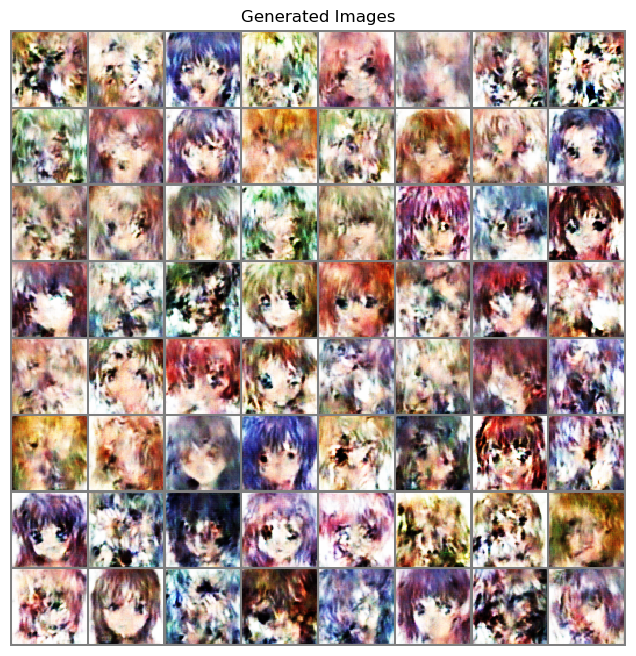

Epoch 26
[100/469]  loss_diff=0.2552 loss_vae=0.0227 loss_d=0.0026 loss_d_eg=0.0113 loss=0.2891
[200/469]  loss_diff=0.2548 loss_vae=0.0285 loss_d=0.0038 loss_d_eg=0.0211 loss=0.3044
[300/469]  loss_diff=0.2655 loss_vae=0.0331 loss_d=0.0041 loss_d_eg=0.0351 loss=0.3338
[400/469]  loss_diff=0.2526 loss_vae=0.0275 loss_d=0.0036 loss_d_eg=0.0089 loss=0.2889
Epoch 27
[100/469]  loss_diff=0.2520 loss_vae=0.0252 loss_d=0.0035 loss_d_eg=0.0089 loss=0.2860
[200/469]  loss_diff=0.2510 loss_vae=0.0265 loss_d=0.0029 loss_d_eg=0.0239 loss=0.3015
[300/469]  loss_diff=0.2552 loss_vae=0.0270 loss_d=0.0029 loss_d_eg=0.0139 loss=0.2962
[400/469]  loss_diff=0.2506 loss_vae=0.0267 loss_d=0.0024 loss_d_eg=0.0139 loss=0.2912
Epoch 28
[100/469]  loss_diff=0.2568 loss_vae=0.0247 loss_d=0.0035 loss_d_eg=0.0085 loss=0.2900
[200/469]  loss_diff=0.2530 loss_vae=0.0348 loss_d=0.0030 loss_d_eg=0.0154 loss=0.3032
[300/469]  loss_diff=0.2559 loss_vae=0.0280 loss_d=0.0025 loss_d_eg=0.0169 loss=0.3008
[400/469]  loss_

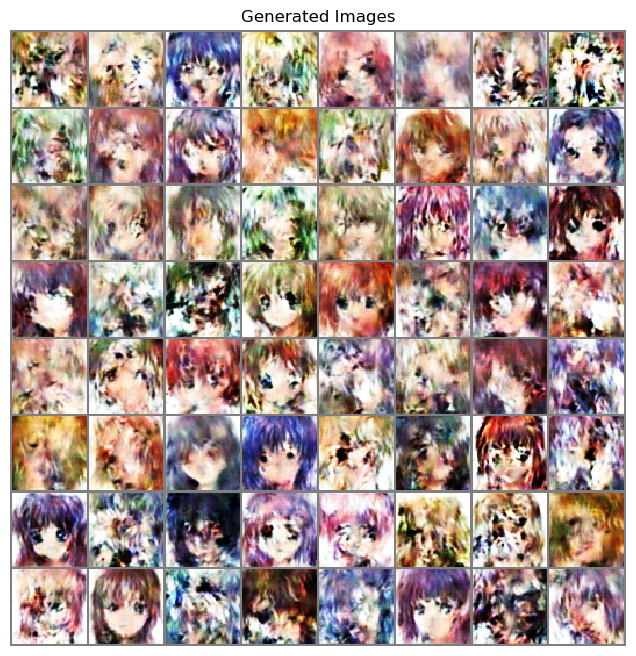

Epoch 31
[100/469]  loss_diff=0.2467 loss_vae=0.0273 loss_d=0.0060 loss_d_eg=0.0213 loss=0.2953
[200/469]  loss_diff=0.2479 loss_vae=0.0245 loss_d=0.0039 loss_d_eg=0.0172 loss=0.2896
[300/469]  loss_diff=0.2505 loss_vae=0.0275 loss_d=0.0030 loss_d_eg=0.0109 loss=0.2889
[400/469]  loss_diff=0.2513 loss_vae=0.0308 loss_d=0.0018 loss_d_eg=0.0242 loss=0.3063
Epoch 32
[100/469]  loss_diff=0.2619 loss_vae=0.0269 loss_d=0.0029 loss_d_eg=0.0189 loss=0.3077
[200/469]  loss_diff=0.2528 loss_vae=0.0259 loss_d=0.0038 loss_d_eg=0.0092 loss=0.2879
[300/469]  loss_diff=0.2626 loss_vae=0.0316 loss_d=0.0019 loss_d_eg=0.0242 loss=0.3185
[400/469]  loss_diff=0.2544 loss_vae=0.0258 loss_d=0.0025 loss_d_eg=0.0133 loss=0.2935
Epoch 33
[100/469]  loss_diff=0.2522 loss_vae=0.0295 loss_d=0.0040 loss_d_eg=0.0093 loss=0.2910
[200/469]  loss_diff=0.2452 loss_vae=0.0326 loss_d=0.0032 loss_d_eg=0.0185 loss=0.2964
[300/469]  loss_diff=0.2479 loss_vae=0.0226 loss_d=0.0027 loss_d_eg=0.0141 loss=0.2846
[400/469]  loss_

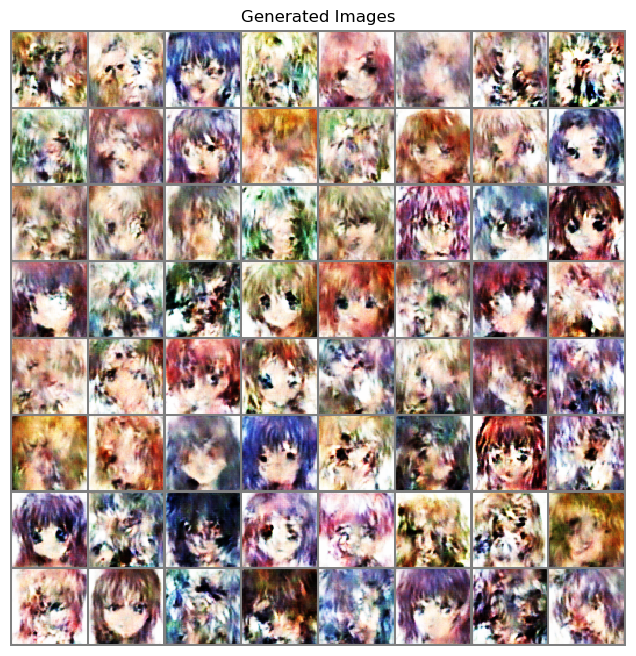

Epoch 36
[100/469]  loss_diff=0.2505 loss_vae=0.0282 loss_d=0.0026 loss_d_eg=0.0141 loss=0.2928
[200/469]  loss_diff=0.2532 loss_vae=0.0274 loss_d=0.0033 loss_d_eg=0.0253 loss=0.3060
[300/469]  loss_diff=0.2570 loss_vae=0.0317 loss_d=0.0025 loss_d_eg=0.0232 loss=0.3119
[400/469]  loss_diff=0.2480 loss_vae=0.0265 loss_d=0.0035 loss_d_eg=0.0204 loss=0.2949
Epoch 37
[100/469]  loss_diff=0.2538 loss_vae=0.0267 loss_d=0.0047 loss_d_eg=0.0180 loss=0.2985
[200/469]  loss_diff=0.2506 loss_vae=0.0269 loss_d=0.0035 loss_d_eg=0.0087 loss=0.2862
[300/469]  loss_diff=0.2537 loss_vae=0.0257 loss_d=0.0040 loss_d_eg=0.0181 loss=0.2975
[400/469]  loss_diff=0.2551 loss_vae=0.0290 loss_d=0.0028 loss_d_eg=0.0185 loss=0.3027
Epoch 38
[100/469]  loss_diff=0.2573 loss_vae=0.0252 loss_d=0.0047 loss_d_eg=0.0059 loss=0.2884
[200/469]  loss_diff=0.2602 loss_vae=0.0287 loss_d=0.0025 loss_d_eg=0.0138 loss=0.3027
[300/469]  loss_diff=0.2463 loss_vae=0.0278 loss_d=0.0028 loss_d_eg=0.0150 loss=0.2891
[400/469]  loss_

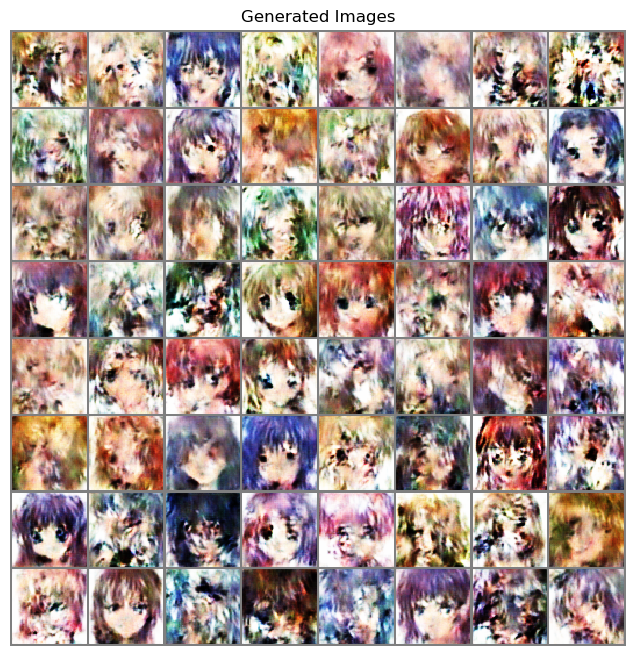

Epoch 41
[100/469]  loss_diff=0.2562 loss_vae=0.0246 loss_d=0.0026 loss_d_eg=0.0137 loss=0.2946
[200/469]  loss_diff=0.2528 loss_vae=0.0254 loss_d=0.0032 loss_d_eg=0.0118 loss=0.2900
[300/469]  loss_diff=0.2494 loss_vae=0.0268 loss_d=0.0039 loss_d_eg=0.0080 loss=0.2842
[400/469]  loss_diff=0.2514 loss_vae=0.0268 loss_d=0.0021 loss_d_eg=0.0181 loss=0.2963
Epoch 42
[100/469]  loss_diff=0.2509 loss_vae=0.0263 loss_d=0.0035 loss_d_eg=0.0110 loss=0.2882
[200/469]  loss_diff=0.2517 loss_vae=0.0258 loss_d=0.0035 loss_d_eg=0.0168 loss=0.2943
[300/469]  loss_diff=0.2621 loss_vae=0.0291 loss_d=0.0026 loss_d_eg=0.0175 loss=0.3087
[400/469]  loss_diff=0.2527 loss_vae=0.0296 loss_d=0.0033 loss_d_eg=0.0240 loss=0.3063
Epoch 43
[100/469]  loss_diff=0.2595 loss_vae=0.0298 loss_d=0.0026 loss_d_eg=0.0125 loss=0.3018
[200/469]  loss_diff=0.2510 loss_vae=0.0229 loss_d=0.0035 loss_d_eg=0.0108 loss=0.2847
[300/469]  loss_diff=0.2467 loss_vae=0.0300 loss_d=0.0041 loss_d_eg=0.0104 loss=0.2872
[400/469]  loss_

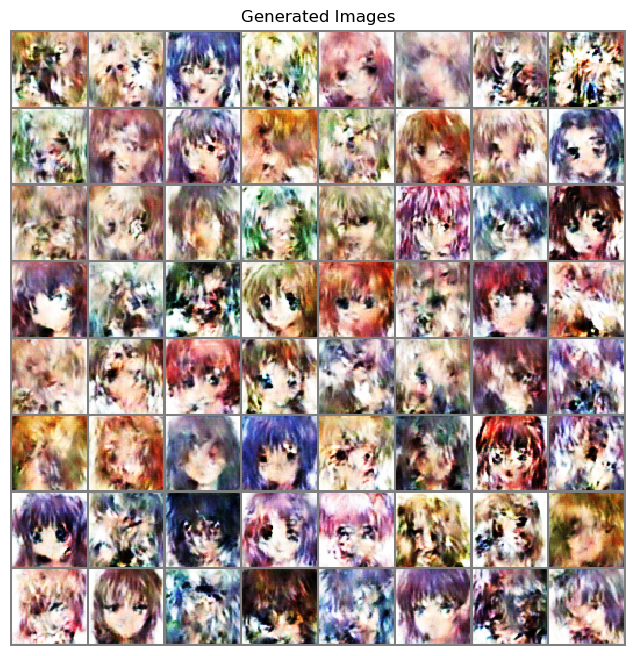

Epoch 46
[100/469]  loss_diff=0.2485 loss_vae=0.0278 loss_d=0.0037 loss_d_eg=0.0226 loss=0.2990
[200/469]  loss_diff=0.2540 loss_vae=0.0233 loss_d=0.0043 loss_d_eg=0.0069 loss=0.2842
[300/469]  loss_diff=0.2647 loss_vae=0.0278 loss_d=0.0054 loss_d_eg=0.0319 loss=0.3244
[400/469]  loss_diff=0.2494 loss_vae=0.0235 loss_d=0.0040 loss_d_eg=0.0081 loss=0.2810
Epoch 47
[100/469]  loss_diff=0.2514 loss_vae=0.0280 loss_d=0.0029 loss_d_eg=0.0132 loss=0.2925
[200/469]  loss_diff=0.2642 loss_vae=0.0284 loss_d=0.0025 loss_d_eg=0.0174 loss=0.3101
[300/469]  loss_diff=0.2514 loss_vae=0.0194 loss_d=0.0031 loss_d_eg=0.0160 loss=0.2868
[400/469]  loss_diff=0.2525 loss_vae=0.0269 loss_d=0.0036 loss_d_eg=0.0112 loss=0.2906
Epoch 48
[100/469]  loss_diff=0.2577 loss_vae=0.0316 loss_d=0.0054 loss_d_eg=0.0292 loss=0.3185
[200/469]  loss_diff=0.2506 loss_vae=0.0339 loss_d=0.0032 loss_d_eg=0.0177 loss=0.3021
[300/469]  loss_diff=0.2565 loss_vae=0.0274 loss_d=0.0027 loss_d_eg=0.0273 loss=0.3112
[400/469]  loss_

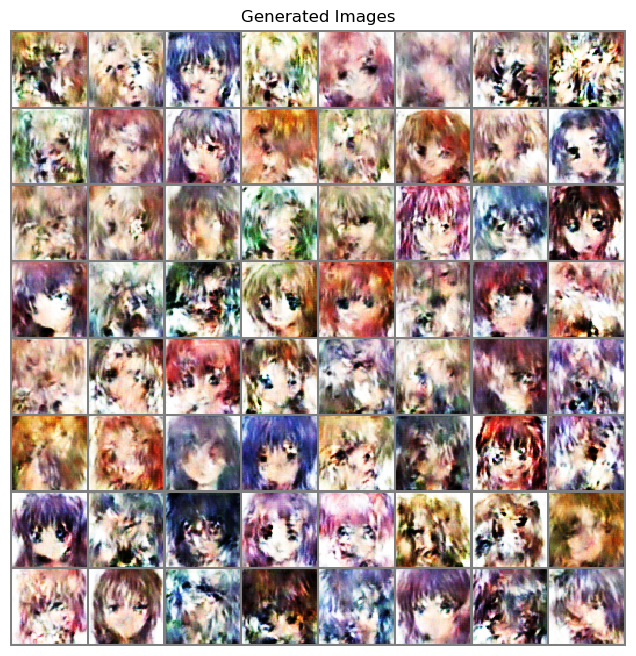

In [8]:
from lpips_pytorch import LPIPS, lpips


def weights_init(m):
    classname = m.__class__.__name__
    if 'BatchNorm' in classname:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.normal_(m.bias.data, 0.0, 0.02)
    elif 'Linear' in classname:
        if 'weight' in m.__dict__ and m.weight is not None:
            nn.init.normal_(m.weight.data, 0.0, 0.1)
        if 'bias' in m.__dict__ and m.bias is not None:
            nn.init.normal_(m.bias.data, 0.0, 0.1)
    else:
        if 'weight' in m.__dict__ and m.weight is not None:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        if 'bias' in m.__dict__ and m.bias is not None:
            nn.init.normal_(m.bias.data, 0.0, 0.02)


def train_epoch(dataloader, net_e, net_g, net_d, loss_fn, optimizer_e, optimizer_g, optimizer_d):
    for batch, x in enumerate(dataloader, 0):
        net_e.zero_grad()
        net_g.zero_grad()
        net_d.zero_grad()
        real = x.to(device)

        encoded = net_e(real)
        fake = net_g(encoded)

        # loss between real and fake
        loss_diff = 2.0*torch.mean((fake-real)**2)**0.5
        # loss_diff = 0.001*lpips(fake, real, net_type='squeeze', version='0.1')

        # KL divergence loss for VAE
        encoded_mean = torch.mean(encoded, axis=0)
        encoded_cov = torch.cov(encoded.T)
        p1 = torch.distributions.multivariate_normal.MultivariateNormal(
            encoded_mean, encoded_cov)
        p2 = torch.distributions.multivariate_normal.MultivariateNormal(
            torch.zeros_like(encoded_mean, device=device),
            torch.eye(LATENT, device=device))
        loss_vae = 0.01 * torch.distributions.kl_divergence(p1, p2)

        # discriminator loss
        k_loss_d = 0.01
        label = torch.ones((real.size(0),), device=device)
        loss_d_real = k_loss_d*loss_fn(net_d(real).view(-1), label)
        label = torch.zeros((real.size(0),), device=device)
        loss_d_fake = k_loss_d*loss_fn(net_d(fake).view(-1), label)
        loss_d = 0.5*(loss_d_real + loss_d_fake)
        loss_d_eg = k_loss_d * loss_fn(1.0-net_d(fake).view(-1), label)

        # train discriminator
        net_d.zero_grad()
        loss_d.backward(retain_graph=True)
        optimizer_d.step()

        # train encoder/generator
        net_e.zero_grad()
        net_g.zero_grad()
        loss = loss_diff + loss_vae + loss_d_eg
        loss.backward()
        optimizer_e.step()
        optimizer_g.step()

        # output stats
        if (batch+1) % 100 == 0:
            print('[%d/%d]  loss_diff=%.4f loss_vae=%.4f loss_d=%.4f loss_d_eg=%.4f loss=%.4f'
                  % (batch+1, len(dataloader),
                     loss_diff.item(), loss_vae.item(),
                     loss_d.item(), loss_d_eg.item(),
                     loss.item()))


def count_weights(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


# load data
dataloader = load_data(AnimeFaceDataset())

# creat models
net_e = Encoder().to(device)
print("Encoder", count_weights(net_e))
print(net_e)

net_g = Generator().to(device)
print("Generator", count_weights(net_g))
print(net_g)

net_d = Discriminator().to(device)
print("Discriminator", count_weights(net_d))
print(net_d)

try:
    net_e.load_state_dict(torch.load(MODEL_E_PATH, map_location=device))
    net_g.load_state_dict(torch.load(MODEL_G_PATH, map_location=device))
    net_d.load_state_dict(torch.load(MODEL_D_PATH, map_location=device))
    print("Model loaded from file.")
except BaseException as e:
    net_e.apply(weights_init)
    net_g.apply(weights_init)
    net_d.apply(weights_init)
    print("Model weights initialized.")

# loss function and optimizer
loss_fn = nn.BCELoss()
optimizer_e = torch.optim.Adam(net_e.parameters(),
                                lr=0.0001, betas=(0.5, 0.999))
optimizer_g = torch.optim.Adam(net_g.parameters(),
                                lr=0.0001, betas=(0.5, 0.999))
optimizer_d = torch.optim.Adam(net_d.parameters(),
                                lr=0.00005, betas=(0.5, 0.999))

# train with progress
fixed_noise = torch.randn(64, LATENT, device=device)
for epoch in range(1, 50+1):
    # train
    print("Epoch", epoch)
    train_epoch(dataloader, net_e, net_g, net_d, loss_fn, optimizer_e, optimizer_g, optimizer_d)
    # plot
    if epoch % 5 == 0:
        generated = net_g(fixed_noise)
        plt.figure(figsize=(8, 8))
        plt.axis("off")
        plt.title("Generated Images")
        plt.imshow(np.transpose(vutils.make_grid(
            generated,
            padding=2, pad_value=0.5, normalize=True).cpu(), (1, 2, 0)),
                    interpolation='nearest')
        plt.show() # on ipynb

# export weights

torch.save(net_e.state_dict(), MODEL_E_PATH)
torch.save(net_g.state_dict(), MODEL_G_PATH)
torch.save(net_d.state_dict(), MODEL_D_PATH)


In [9]:
param_i = 0
layers = {}
prev_path = None
for layer in net_g.main:
    # print(layer.__class__.__name__)
    if layer.__class__.__name__ == "Linear":
        param_i += 1
        data = list(layer.parameters())[0].data.cpu()
        shape = '_'.join(map(str, data.shape))
        path = EXPORT_PATH+"/w{:02d}_{}.bin".format(param_i, shape)
        layers[path] = data.numpy()
        prev_path = path
    elif layer.__class__.__name__ == "ConvTranspose2d":
        param_i += 1
        data = list(layer.parameters())[0].data.cpu()
        shape = '_'.join(map(str, data.shape))
        path = EXPORT_PATH+"/w{:02d}_{}.bin".format(param_i, shape)
        layers[path] = data.numpy()
        prev_path = path
    elif layer.__class__.__name__ == "BatchNorm2d":
        assert len(layers[prev_path].shape) == 4
        mu = layer.running_mean.cpu()
        var = layer.running_var.cpu()
        invstdev = 1.0 / (var + 1e-5)**0.5
        data = list(layer.parameters())
        gamma, beta = data[0].data.cpu(), data[1].data.cpu()
        a = gamma * invstdev
        b = beta - mu * gamma * invstdev
        a, b = a.numpy(), b.numpy()
        layers[prev_path] = layers[prev_path] * a[:, np.newaxis, np.newaxis]
        # print(a.shape, b.shape, layers[prev_path].shape)
        shape = '_'.join(map(str, b.shape))
        path = EXPORT_PATH+"/b{:02d}_{}.bin".format(param_i, shape)
        layers[path] = b
    else:
        prev_path = None

for path, data in layers.items():
    data.astype(np.float32).tofile(path)